In [12]:
import os
import nibabel as nib
from scipy import ndimage
from skimage import exposure, filters
import subprocess
from nilearn.image import resample_to_img
import matplotlib as plt
import matplotlib.pyplot as plt
import nibabel as nib
import matplotlib.pyplot as plt
import os
import nibabel as nib
import numpy as np
import os



In [8]:
# Setup FSL environment (for brain extraction)
# Ensure FSLDIR is set
os.environ['FSLDIR'] = '/usr/local/fsl'
os.environ['PATH'] = os.environ['FSLDIR'] + '/bin:' + os.environ['PATH']

# Set FSLOUTPUTTYPE environment variable
os.environ['FSLOUTPUTTYPE'] = 'NIFTI_GZ'



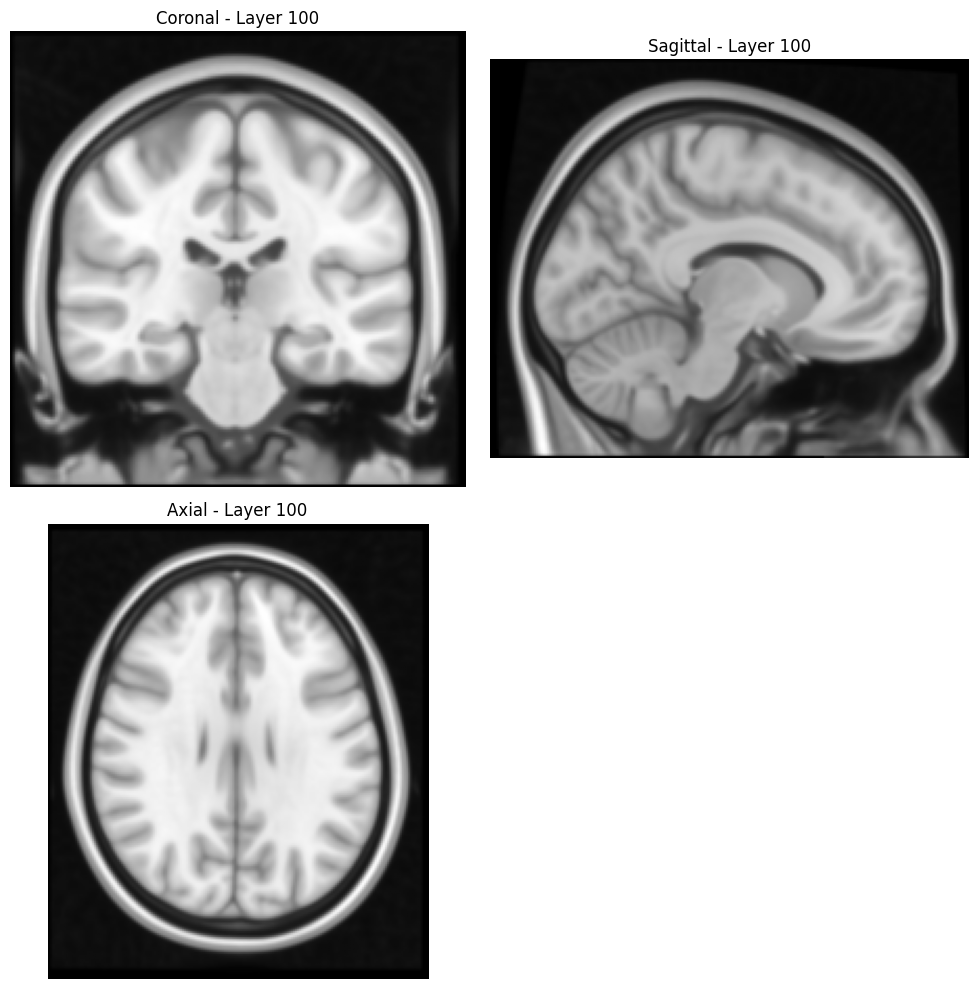

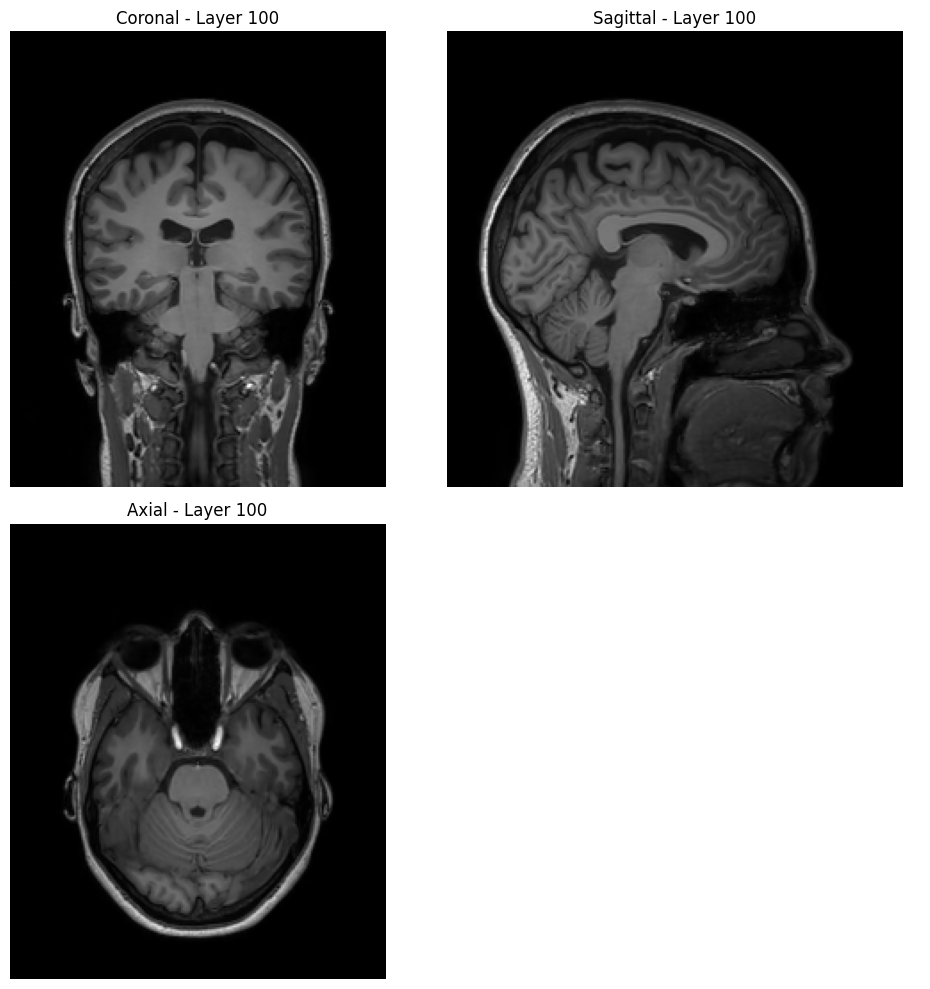

In [178]:
import nibabel as nib
import matplotlib.pyplot as plt
import os

def load_and_show_sRMI(nifti_path, slice_index):
    """
    Loads a NIfTI image and shows three orthogonal slices: coronal (top), axial (bottom), 
    and sagittal (right) in a 2x2 grid with the bottom left empty.
    
    :param nifti_path: Path to the NIfTI file (.nii or .nii.gz).
    :param slice_index: Index of the slice you want to view.
    """
    # Load the NIfTI image
    img = nib.load(nifti_path)
    data = img.get_fdata()
    
    # Validate slice_index
    if (slice_index < 0 or 
        slice_index >= min(data.shape[0], data.shape[1], data.shape[2])):
        print(f"Index out of range. It must be between 0 and {min(data.shape[0], data.shape[1], data.shape[2]) - 1}.")
        return
    
    # Create subplots for 2x2 grid
    fig, axes = plt.subplots(2, 2, figsize=(10, 10))
    
    # Coronal slice (top)
    axes[0, 0].imshow(data[:, slice_index, :].T, cmap="gray", origin="lower")
    axes[0, 0].set_title(f"Coronal - Layer {slice_index}")
    axes[0, 0].axis("off")
    
    # Axial slice (bottom)
    axes[1, 0].imshow(data[:, :, slice_index].T, cmap="gray", origin="lower")
    axes[1, 0].set_title(f"Axial - Layer {slice_index}")
    axes[1, 0].axis("off")
    
    # Sagittal slice (right)
    axes[0, 1].imshow(data[slice_index, :, :].T, cmap="gray", origin="lower")
    axes[0, 1].set_title(f"Sagittal - Layer {slice_index}")
    axes[0, 1].axis("off")
    
    # Empty subplot (bottom right)
    axes[1, 1].axis("off")
    
    plt.tight_layout()
    plt.show()

# Example usage
nifti_path = os.path.normpath('/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/MNI152_T1_1mm.nii.gz')
slice_index = 100
load_and_show_sRMI(nifti_path, slice_index)

nifti_path = os.path.normpath('/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/01_Images_Raw/SAN_003_V1.nii.gz')
load_and_show_sRMI(nifti_path, slice_index)


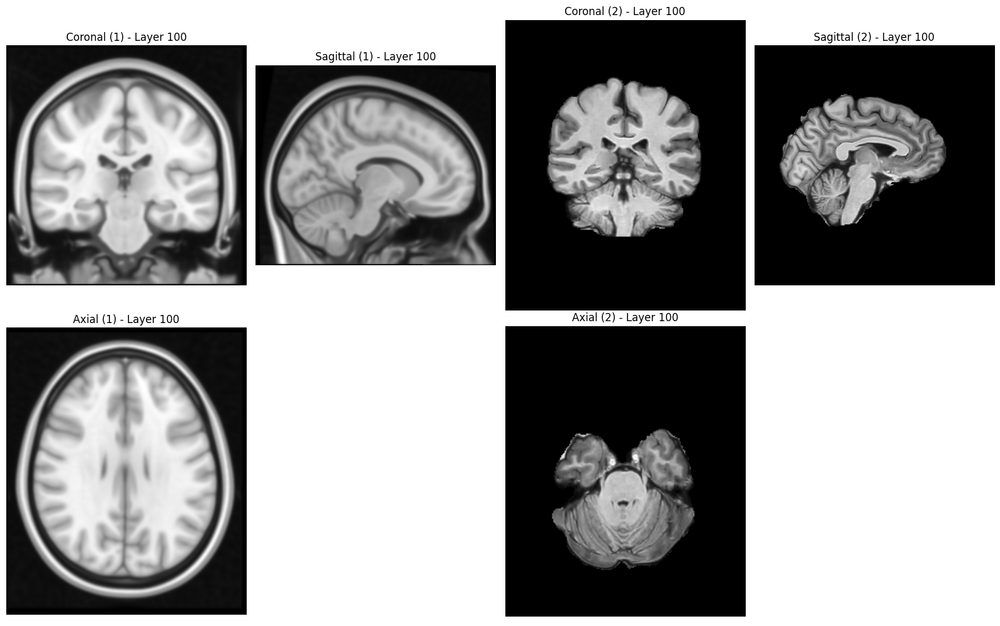

In [302]:
def compare_sRMI_images(nifti_path1, nifti_path2, slice_index, size1=(10, 10), size2=(10, 10)):
    """
    Loads two NIfTI images and shows three orthogonal slices: coronal (top), axial (bottom),
    and sagittal (right) for each image side by side.
    
    :param nifti_path1: Path to the first NIfTI file (.nii or .nii.gz).
    :param nifti_path2: Path to the second NIfTI file (.nii or .nii.gz).
    :param slice_index: Index of the slice you want to view.
    :param size1: Tuple indicating the size of the first image's figure.
    :param size2: Tuple indicating the size of the second image's figure.
    """
    # Load the NIfTI images
    img1 = nib.load(nifti_path1).get_fdata()
    img2 = nib.load(nifti_path2).get_fdata()
    
    # Validate slice_index
    min_index = min(img1.shape[0], img1.shape[1], img1.shape[2], img2.shape[0], img2.shape[1], img2.shape[2])
    if slice_index < 0 or slice_index >= min_index:
        print(f"Index out of range. It must be between 0 and {min_index - 1}.")
        return
    
    # Create subplots
    fig, axes = plt.subplots(2, 4, figsize=(size1[0] + size2[0], max(size1[1], size2[1])))
    
    # First image slices
    axes[0, 0].imshow(img1[:, slice_index, :].T, cmap="gray", origin="lower")
    axes[0, 0].set_title(f"Coronal (1) - Layer {slice_index}")
    axes[0, 0].axis("off")
    
    axes[1, 0].imshow(img1[:, :, slice_index].T, cmap="gray", origin="lower")
    axes[1, 0].set_title(f"Axial (1) - Layer {slice_index}")
    axes[1, 0].axis("off")
    
    axes[0, 1].imshow(img1[slice_index, :, :].T, cmap="gray", origin="lower")
    axes[0, 1].set_title(f"Sagittal (1) - Layer {slice_index}")
    axes[0, 1].axis("off")
    
    axes[1, 1].axis("off")  # Empty
    
    # Second image slices
    axes[0, 2].imshow(img2[:, slice_index, :].T, cmap="gray", origin="lower")
    axes[0, 2].set_title(f"Coronal (2) - Layer {slice_index}")
    axes[0, 2].axis("off")
    
    axes[1, 2].imshow(img2[:, :, slice_index].T, cmap="gray", origin="lower")
    axes[1, 2].set_title(f"Axial (2) - Layer {slice_index}")
    axes[1, 2].axis("off")
    
    axes[0, 3].imshow(img2[slice_index, :, :].T, cmap="gray", origin="lower")
    axes[0, 3].set_title(f"Sagittal (2) - Layer {slice_index}")
    axes[0, 3].axis("off")
    
    axes[1, 3].axis("off")  # Empty
    
    plt.tight_layout()
    plt.show()

# Example usage
nifti_path1 = os.path.normpath('/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/MNI152_T1_1mm.nii.gz')
nifti_path2 = os.path.normpath('/home/jp/NeuroImagen/Biomarcadores/BIomarcadores-T1-Procesados/SAN_021_V1.nii.gz')
slice_index = 100
compare_sRMI_images(nifti_path1, nifti_path2, slice_index, size1=(10, 10), size2=(6, 8))


In [189]:
def reorient_nifti_image(nifti_path, output_path, rotation, times=1):
    """
    Reorients a NIfTI image by rotating in specified directions multiple times and saves the result.
    
    :param nifti_path: Path to the NIfTI file (.nii or .nii.gz).
    :param output_path: Path to save the reoriented NIfTI file.
    :param rotation: Rotate the image ('left', 'right', 'up', 'down').
    :param times: Number of times to rotate in the specified direction.
    """
    # Load the NIfTI image
    img = nib.load(nifti_path)
    data = img.get_fdata()
    
    # Apply rotation
    if rotation == 'left':
        data = np.rot90(data, k=times, axes=(0, 1))
    elif rotation == 'right':
        data = np.rot90(data, k=-times, axes=(0, 1))
    elif rotation == 'up':
        data = np.rot90(data, k=times, axes=(1, 2))
    elif rotation == 'down':
        data = np.rot90(data, k=-times, axes=(1, 2))
    else:
        print("Invalid rotation. Use 'left', 'right', 'up', or 'down'.")
        return
    
    # Create new NIfTI image and save
    new_img = nib.Nifti1Image(data, img.affine, img.header)
    nib.save(new_img, output_path)
    print(f"Reoriented image saved to: {output_path}")


In [187]:
def swap_sagittal_axial(nifti_path, output_path):
    """
    Swaps the sagittal and axial slices of a NIfTI image and saves the result.
    
    :param nifti_path: Path to the NIfTI file (.nii or .nii.gz).
    :param output_path: Path to save the swapped NIfTI file.
    """
    # Load the NIfTI image
    img = nib.load(nifti_path)
    data = img.get_fdata()
    
    # Swap sagittal and axial slices
    swapped_data = np.transpose(data, (2, 1, 0))
    
    # Create new NIfTI image and save
    new_img = nib.Nifti1Image(swapped_data, img.affine, img.header)
    nib.save(new_img, output_path)
    print(f"Swapped sagittal and axial slices. Image saved to: {output_path}")


In [188]:
def rotate_right_and_swap_sagittal_axial(nifti_path, output_path):
    """
    Rotates the NIfTI image to the right and swaps the sagittal and axial slices.
    
    :param nifti_path: Path to the NIfTI file (.nii or .nii.gz).
    :param output_path: Path to save the processed NIfTI file.
    """
    # Load the NIfTI image
    img = nib.load(nifti_path)
    data = img.get_fdata()
    
    # Rotate the image to the right (90 degrees clockwise)
    rotated_data = np.rot90(data, k=-1, axes=(0, 1))
    
    # Swap sagittal and axial slices
    swapped_data = np.transpose(rotated_data, (2, 1, 0))
    
    # Create new NIfTI image and save
    new_img = nib.Nifti1Image(swapped_data, img.affine, img.header)
    nib.save(new_img, output_path)
    print(f"Rotated right and swapped sagittal and axial slices. Image saved to: {output_path}")


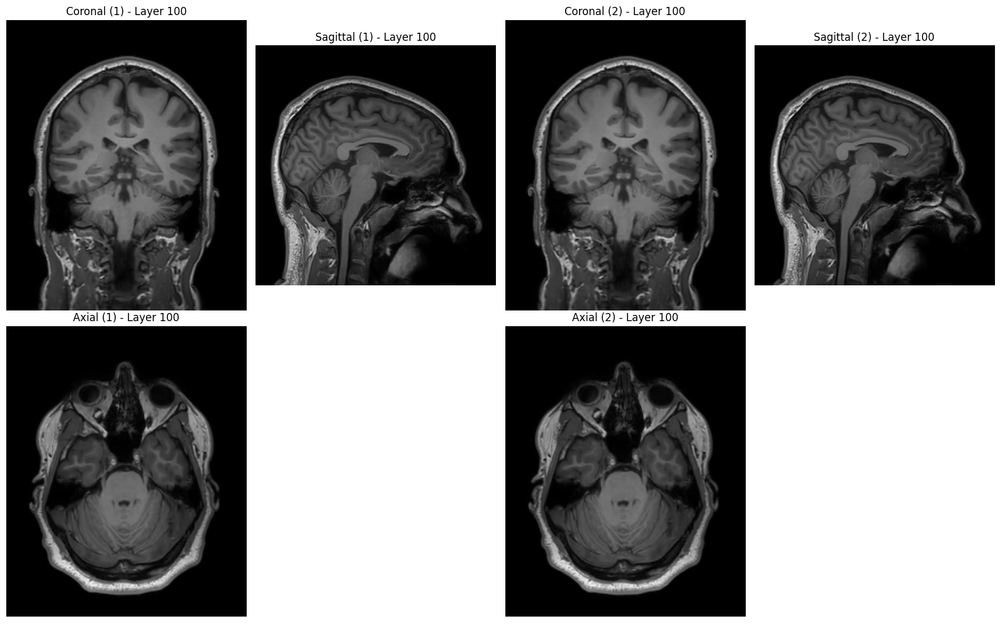

In [268]:
def normalize_image(image_path, output_path):
    """
    Loads a NIfTI image, normalizes its intensity, saves the normalized image, and displays slices of the original and normalized images.

    Parameters:
    - image_path : str
        Path to the NIfTI image file to be normalized.
    - output_path : str
        Path to save the normalized image.
    """
    # Load the NIfTI image
    img = nib.load(image_path)
    
    # Get the image data
    image_data = img.get_fdata()
    
    # Normalize the image intensity
    normalized_data = exposure.rescale_intensity(image_data, out_range=(0, 1))
    
    # Create a new NIfTI object with the normalized data
    normalized_img = nib.Nifti1Image(normalized_data, img.affine, img.header)
    
    # Save the normalized image
    nib.save(normalized_img, output_path)
    
# Define the file paths
image_path = os.path.normpath('/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/01_Images_Raw/SAN_021_V1.nii.gz')
output_path = os.path.normpath('/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/03_Images_Normalize/SAN_021_V1.nii.gz')

# Call the function to normalize, save, and visualize the image
normalize_image(image_path, output_path)
slice_index = 100           # Index of the slice to display
compare_sRMI_images(image_path, output_path, slice_index, size1=(10, 10), size2=(6, 8))

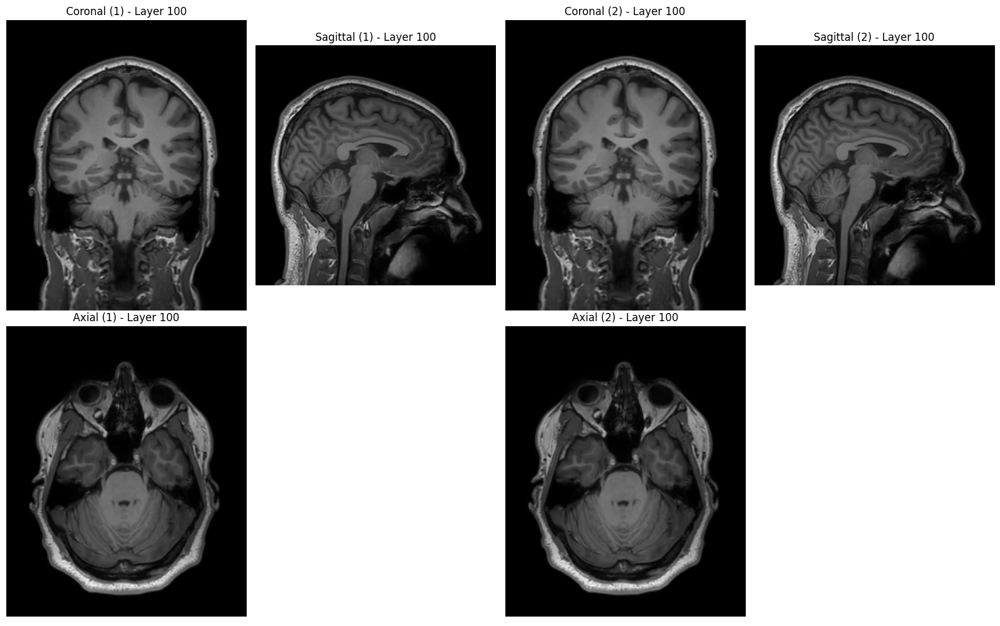

In [269]:
def median_filter_image(image_path, output_path, size=1):
    """
    Load a NIfTI image, apply a median filter, save the filtered image, and display slices of the original and filtered image.

    Parameters:
    - image_path : str
        Path to the NIfTI image file to process.
    - output_path : str
        Path to save the filtered image.
    - size : int, optional
        Size of the median filter. The default value is 3.
    """
    # Load the NIfTI image
    img = nib.load(image_path)
    
    # Get the image data
    image_data = img.get_fdata()
    
    # Apply the median filter
    filtered_data = ndimage.median_filter(image_data, size=size)
    
    # Create a new NIfTI object with the filtered data
    filtered_img = nib.Nifti1Image(filtered_data, img.affine, img.header)
    
    # Save the filtered image
    nib.save(filtered_img, output_path)
    

# Define the file paths
image_path = os.path.normpath('/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/03_Images_Normalize/SAN_021_V1.nii.gz')
output_path = os.path.normpath('/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/04_Images_MedianFilter/SAN_021_V1.nii.gz')

# Call the function to filter, save, and visualize the image
median_filter_image(image_path, output_path)
slice_index = 100           # Index of the slice to display
compare_sRMI_images(image_path, output_path, slice_index, size1=(10, 10), size2=(6, 8))



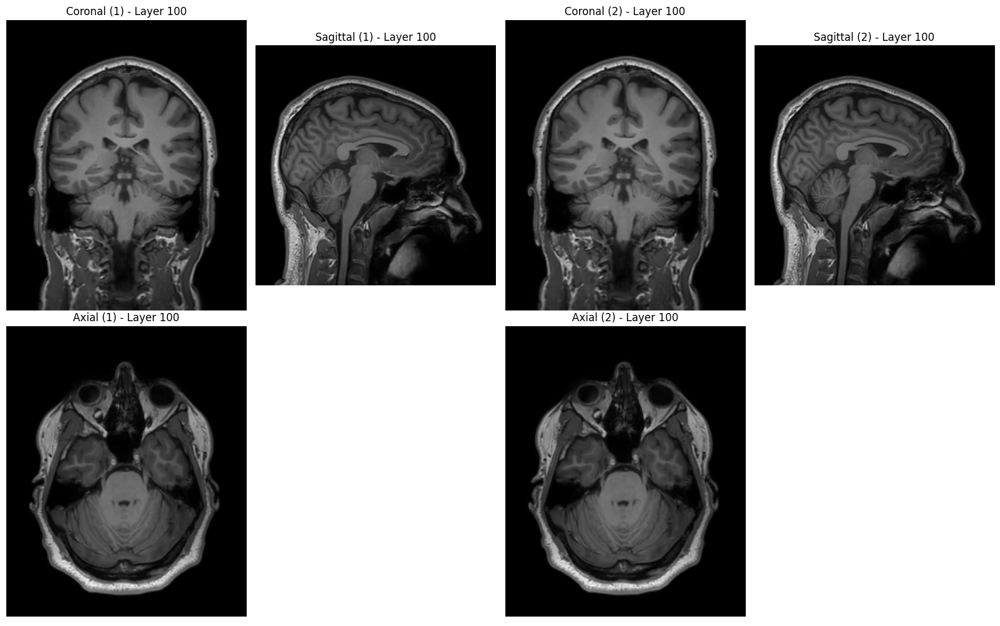

In [270]:
def apply_gaussian_filter(image_path, output_path, sigma=0.2):
    """
    Load a NIfTI image, apply a Gaussian filter, save the smoothed image, and display slices of the original and smoothed image.

    Parameters:
    - image_path : str
        Path to the NIfTI image file to process.
    - output_path : str
        Path to save the smoothed image.
    - sigma : float, optional
        Standard deviation of the Gaussian filter. The default value is 0.1.
    """
    # Load the NIfTI image
    img = nib.load(image_path)
    
    # Get the image data
    image_data = img.get_fdata()
    
    # Apply the Gaussian filter
    smoothed_data = ndimage.gaussian_filter(image_data, sigma=sigma)
    
    # Create a new NIfTI object with the smoothed data
    smoothed_img = nib.Nifti1Image(smoothed_data, img.affine, img.header)
    
    # Save the smoothed image
    nib.save(smoothed_img, output_path)
    

# Define the file paths
image_path = os.path.normpath('/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/04_Images_MedianFilter/SAN_021_V1.nii.gz')
output_path = os.path.normpath('/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/05_Images_GaussianFilter/SAN_021_V1.nii.gz')

# Call the function to filter, save, and visualize the image
apply_gaussian_filter(image_path, output_path)

# Parameters for visualization
slice_index = 100           # Index of the slice to display
compare_sRMI_images(image_path, output_path, slice_index, size1=(10, 10), size2=(6, 8))




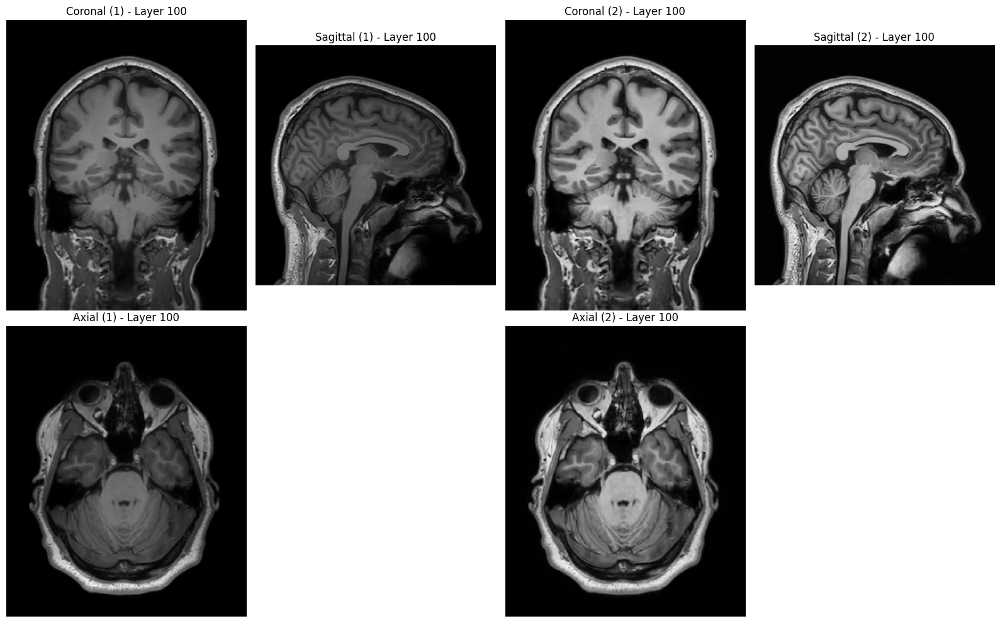

In [ ]:
def adaptive_histogram_equalization(image_path, output_path, clip_limit=0.01):
    """
    Load a NIfTI image, apply adaptive histogram equalization, save the contrast-enhanced image, and display slices of the original and enhanced image.

    Parameters:
    - image_path : str
        Path to the NIfTI image file to process.
    - output_path : str
        Path to save the contrast-enhanced image.
    - clip_limit : float, optional
        Clip limit for the adaptive equalization. The default value is 2.
    """
    # Load the NIfTI image
    img = nib.load(image_path)
    
    # Get the image data
    image_data = img.get_fdata()
    
    # Apply adaptive histogram equalization
    enhanced_data = exposure.equalize_adapthist(image_data, clip_limit=clip_limit)
    
    # Create a new NIfTI object with the enhanced contrast data
    enhanced_img = nib.Nifti1Image(enhanced_data, img.affine, img.header)
    
    # Save the contrast-enhanced image
    nib.save(enhanced_img, output_path)
    

# Define the file paths
image_path = os.path.normpath('/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/05_Images_GaussianFilter/SAN_021_V1.nii.gz')
output_path = os.path.normpath('/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/06_Images_HistogramEquialization/SAN_021_V1.nii.gz')

# Call the function to apply adaptive histogram equalization, save, and visualize the image
adaptive_histogram_equalization(image_path, output_path)
compare_sRMI_images(image_path, output_path, slice_index, size1=(10, 10), size2=(6, 8))



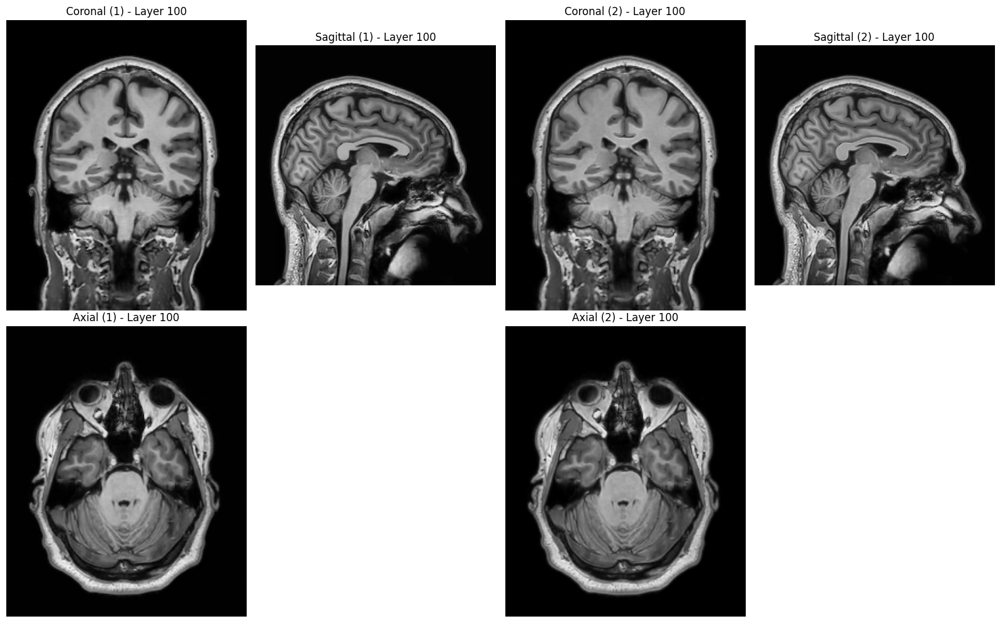

In [272]:
def enhance_edges(image_path, output_path, weight=0.5):
    """
    Load a NIfTI image, enhance the edges using the Sobel filter, save the image with enhanced edges, and display slices of the original and enhanced image.

    Parameters:
    - image_path : str
        Path to the NIfTI image file to process.
    - output_path : str
        Path to save the image with enhanced edges.
    - weight : float, optional
        Weight to add to the edge enhancement. The default value is 0.2.
    """
    # Load the NIfTI image
    img = nib.load(image_path)
    
    # Get the image data
    image_data = img.get_fdata()
    
    # Apply the Sobel filter to enhance the edges
    edges = filters.sobel(image_data)
    enhanced_data = image_data + weight * edges
    
    # Create a new NIfTI object with the enhanced edges
    enhanced_img = nib.Nifti1Image(enhanced_data, img.affine, img.header)
    
    # Save the image with enhanced edges
    nib.save(enhanced_img, output_path)
    

# Define the file paths
image_path = os.path.normpath('/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/06_Images_HistogramEquialization/SAN_021_V1.nii.gz')
output_path = os.path.normpath('/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/07_Images_EnhanceEdges/SAN_021_V1.nii.gz')

# Call the function to apply enhance_edges, save, and visualize the image
enhance_edges(image_path, output_path)
compare_sRMI_images(image_path, output_path, slice_index, size1=(10, 10), size2=(6, 8))



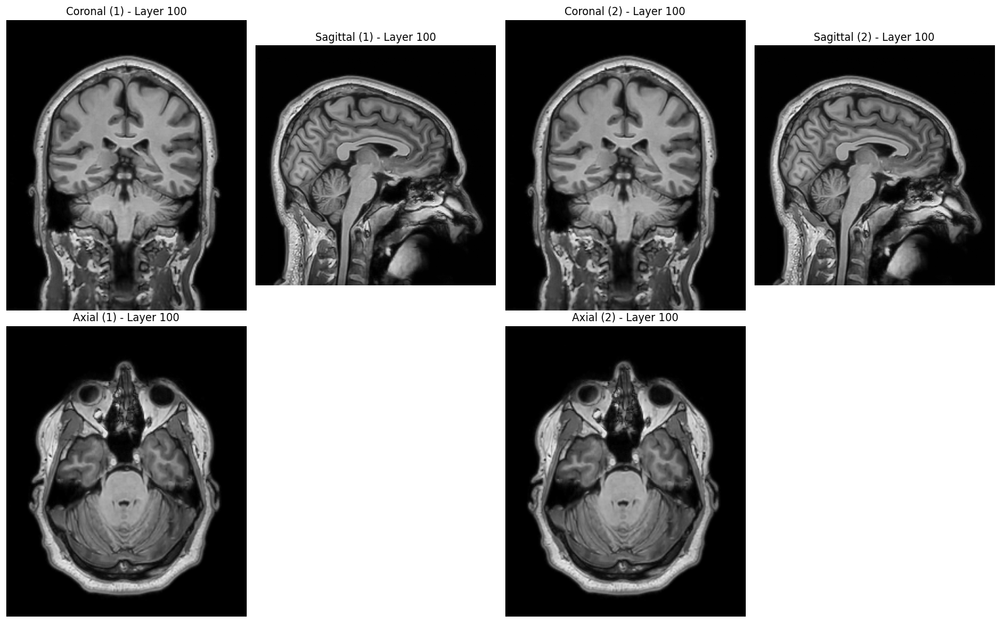

In [273]:
# Definir las rutas de los archivos
image_path = os.path.normpath('/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/07_Images_EnhanceEdges/SAN_021_V1.nii.gz')
output_path = os.path.normpath('/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/08_Images_Normalize_v2/SAN_021_V1.nii.gz')

# Llamar a la función para normalizar la imagen, guardar y visualizar la imagen
normalize_image(image_path, output_path)

# Parámetros para la visualización
corte_index = 100          # Índice del corte a visualizar
compare_sRMI_images(image_path, output_path, slice_index, size1=(10, 10), size2=(6, 8))


Brain extraction completed. Output saved as /home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/09_Images_SkullStripping/SAN_021_V1.nii.gz


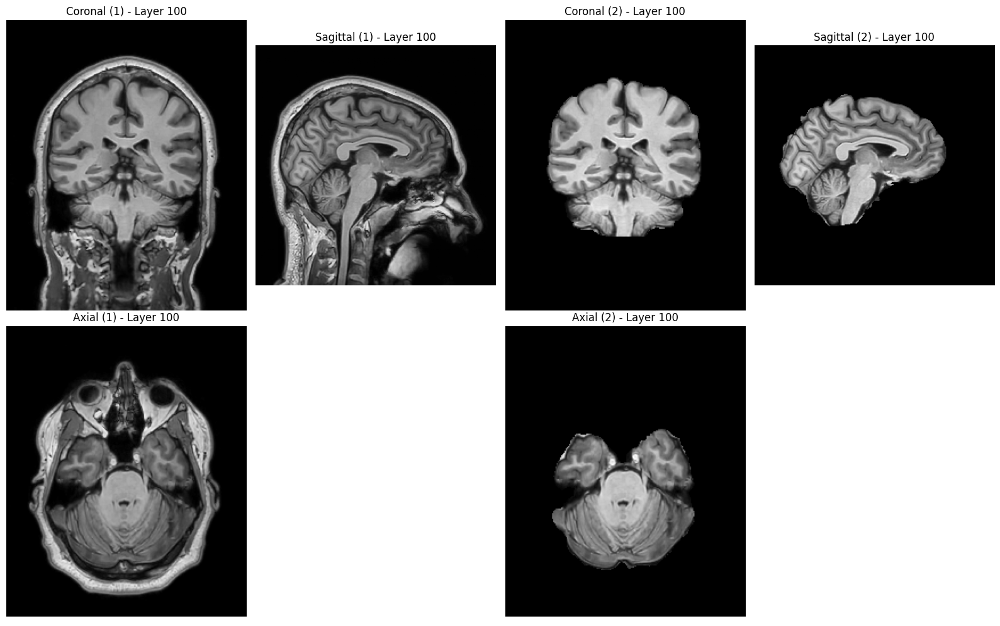

In [274]:
def skull_stripping(input_image, output_image):
    command = [
        'bet', input_image, output_image,
        '-f', '0.29', '-g', '0.2', '-R', '-B',
    ]
    result = subprocess.run(command, capture_output=True, text=True)
    if result.returncode == 0:
        print(f"Brain extraction completed. Output saved as {output_image}")
    else:
        print("Error in brain extraction:", result.stderr)

# Define the file paths
image_path = os.path.normpath('/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/08_Images_Normalize_v2/SAN_021_V1.nii.gz')
output_path = os.path.normpath('/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/09_Images_SkullStripping/SAN_021_V1.nii.gz')

# Call the function
skull_stripping(image_path, output_path)
slice_index = 100           # Index of the slice to display

compare_sRMI_images(image_path, output_path, slice_index, size1=(10, 10), size2=(6, 8))



In [275]:
subprocess.run(['fsleyes', image_path, output_path])

CompletedProcess(args=['fsleyes', '/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/08_Images_Normalize_v2/SAN_021_V1.nii.gz', '/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/09_Images_SkullStripping/SAN_021_V1.nii.gz'], returncode=0)

Imagen de referencia y la imagen a procesar


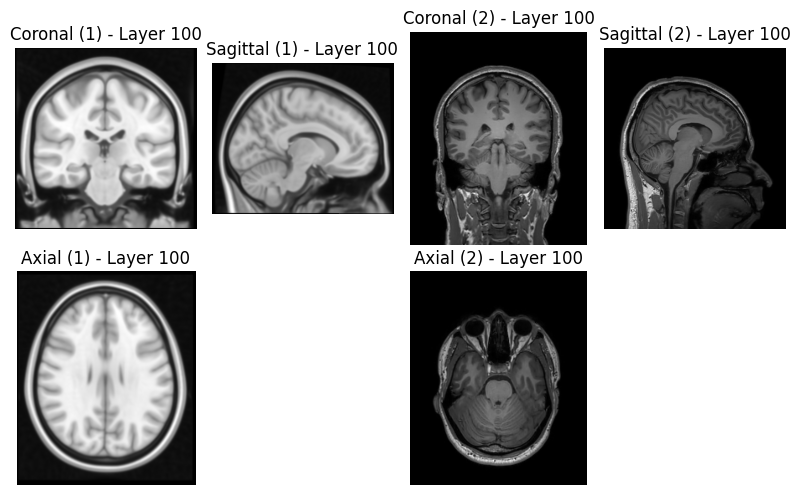

Imagen normalizada


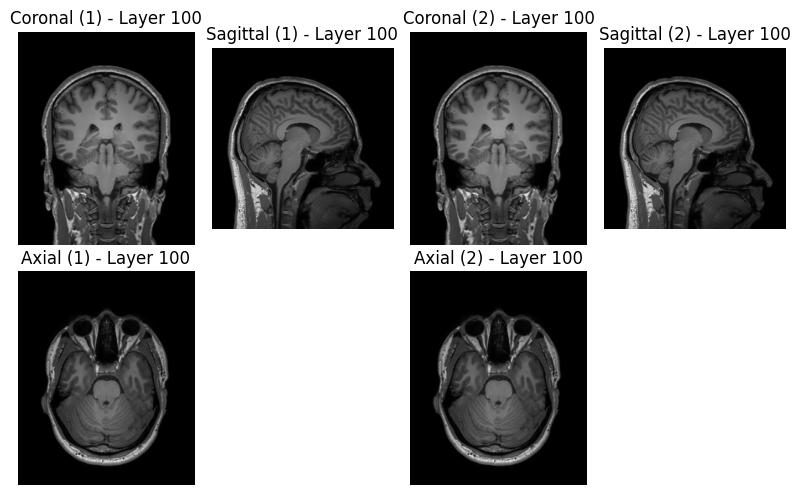

Imagen con filtro de mediana


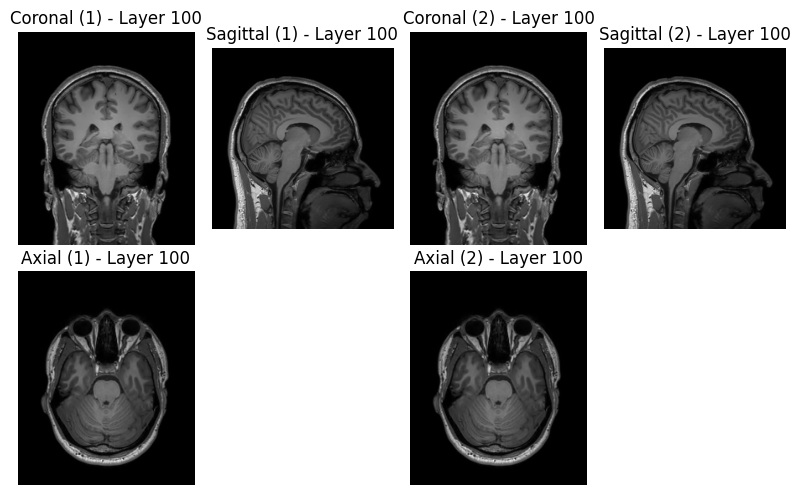

Imagen con filtro de gaussiano


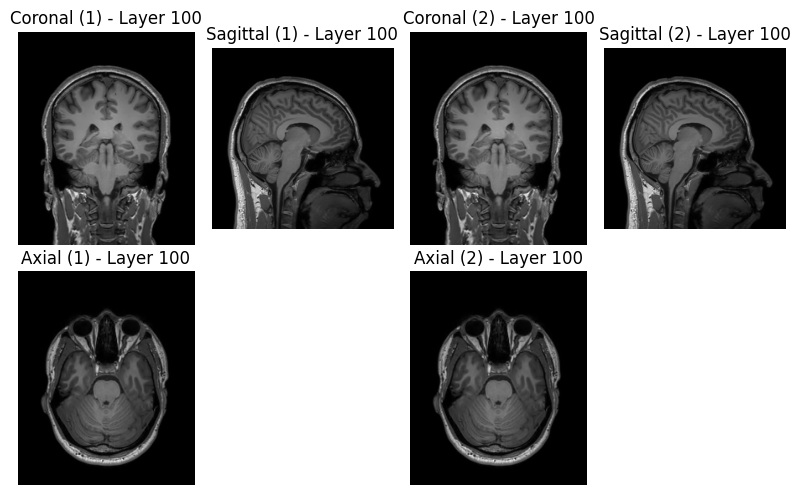

Imagen con ecualización de histograma adaptativa


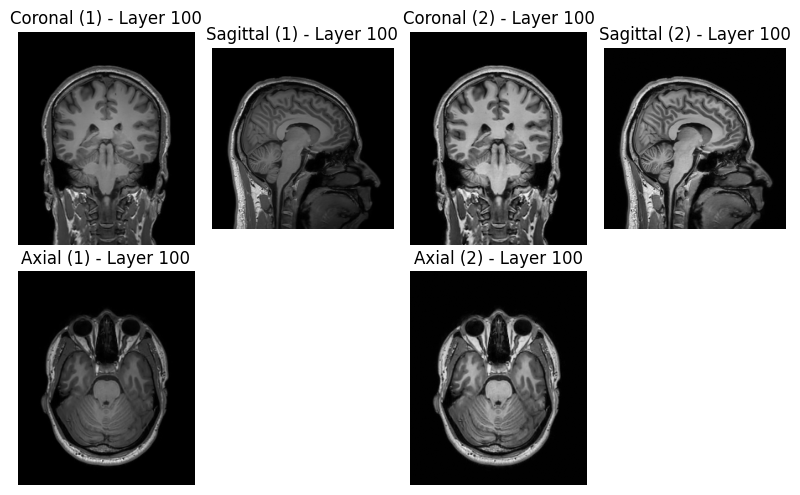

Imagen con realce de bordes


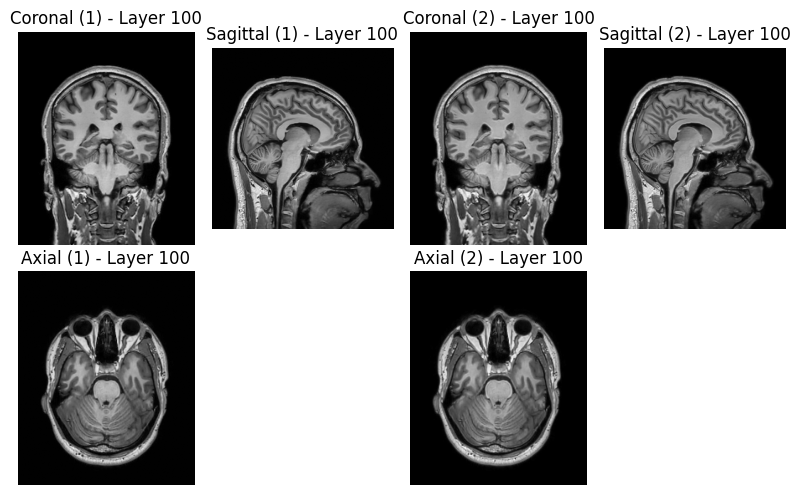

Imagen normalizada por segunda vez
Imagen con skull stripping
Brain extraction completed. Output saved as /home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/09_Images_SkullStripping/SAN_069_V1.nii.gz


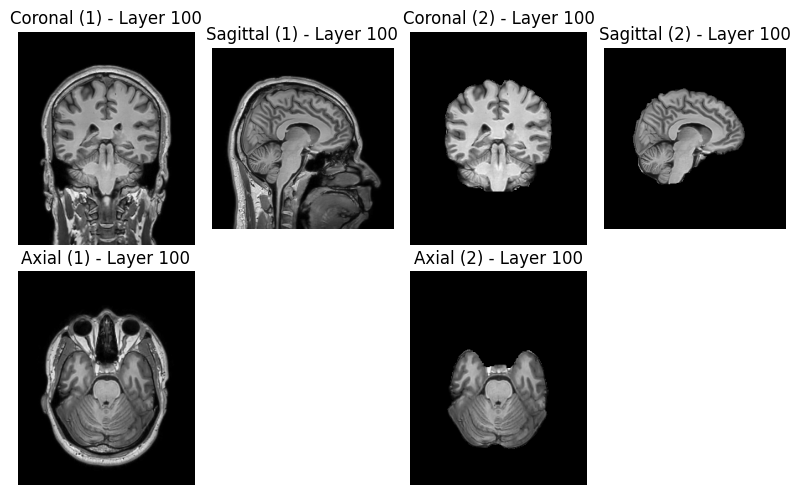

CompletedProcess(args=['fsleyes', '/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/08_Images_Normalize_v2/SAN_069_V1.nii.gz', '/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/09_Images_SkullStripping/SAN_069_V1.nii.gz'], returncode=0)

In [301]:
# Define el número de paciente manualmente
num_paciente = "069"
slice_index = 100           # Index of the slice to display

print("Imagen de referencia y la imagen a procesar")


def compare_sRMI_images(nifti_path1, nifti_path2, slice_index, size1=(10, 10), size2=(10, 10)):
    """
    Loads two NIfTI images and shows three orthogonal slices: coronal (top), axial (bottom),
    and sagittal (right) for each image side by side.
    
    :param nifti_path1: Path to the first NIfTI file (.nii or .nii.gz).
    :param nifti_path2: Path to the second NIfTI file (.nii or .nii.gz).
    :param slice_index: Index of the slice you want to view.
    :param size1: Tuple indicating the size of the first image's figure.
    :param size2: Tuple indicating the size of the second image's figure.
    """
    # Load the NIfTI images
    img1 = nib.load(nifti_path1).get_fdata()
    img2 = nib.load(nifti_path2).get_fdata()
    
    # Validate slice_index
    min_index = min(img1.shape[0], img1.shape[1], img1.shape[2], img2.shape[0], img2.shape[1], img2.shape[2])
    if slice_index < 0 or slice_index >= min_index:
        print(f"Index out of range. It must be between 0 and {min_index - 1}.")
        return
    
    # Create subplots
    fig, axes = plt.subplots(2, 4, figsize=(size1[0] + size2[0], max(size1[1], size2[1])))
    
    # First image slices
    axes[0, 0].imshow(img1[:, slice_index, :].T, cmap="gray", origin="lower")
    axes[0, 0].set_title(f"Coronal (1) - Layer {slice_index}")
    axes[0, 0].axis("off")
    
    axes[1, 0].imshow(img1[:, :, slice_index].T, cmap="gray", origin="lower")
    axes[1, 0].set_title(f"Axial (1) - Layer {slice_index}")
    axes[1, 0].axis("off")
    
    axes[0, 1].imshow(img1[slice_index, :, :].T, cmap="gray", origin="lower")
    axes[0, 1].set_title(f"Sagittal (1) - Layer {slice_index}")
    axes[0, 1].axis("off")
    
    axes[1, 1].axis("off")  # Empty
    
    # Second image slices
    axes[0, 2].imshow(img2[:, slice_index, :].T, cmap="gray", origin="lower")
    axes[0, 2].set_title(f"Coronal (2) - Layer {slice_index}")
    axes[0, 2].axis("off")
    
    axes[1, 2].imshow(img2[:, :, slice_index].T, cmap="gray", origin="lower")
    axes[1, 2].set_title(f"Axial (2) - Layer {slice_index}")
    axes[1, 2].axis("off")
    
    axes[0, 3].imshow(img2[slice_index, :, :].T, cmap="gray", origin="lower")
    axes[0, 3].set_title(f"Sagittal (2) - Layer {slice_index}")
    axes[0, 3].axis("off")
    
    axes[1, 3].axis("off")  # Empty
    
    plt.tight_layout()
    plt.show()

# Define the file paths
nifti_path1 = os.path.normpath('/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/MNI152_T1_1mm.nii.gz')
output_path = os.path.normpath(f'/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/01_Images_Raw/SAN_{num_paciente}_V1.nii.gz')
compare_sRMI_images(nifti_path1, output_path, slice_index, size1=(3, 3), size2=(5, 5))

print("Imagen normalizada")

def normalize_image(image_path, output_path):
    """
    Loads a NIfTI image, normalizes its intensity, saves the normalized image, and displays slices of the original and normalized images.

    Parameters:
    - image_path : str
        Path to the NIfTI image file to be normalized.
    - output_path : str
        Path to save the normalized image.
    """
    # Load the NIfTI image
    img = nib.load(image_path)
    
    # Get the image data
    image_data = img.get_fdata()
    
    # Normalize the image intensity
    normalized_data = exposure.rescale_intensity(image_data, out_range=(0, 1))
    
    # Create a new NIfTI object with the normalized data
    normalized_img = nib.Nifti1Image(normalized_data, img.affine, img.header)
    
    # Save the normalized image
    nib.save(normalized_img, output_path)
    
# Define the file paths
image_path = os.path.normpath(f'/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/01_Images_Raw/SAN_{num_paciente}_V1.nii.gz')
output_path = os.path.normpath(f'/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/03_Images_Normalize/SAN_{num_paciente}_V1.nii.gz')

# Call the function to normalize, save, and visualize the image
normalize_image(image_path, output_path)
compare_sRMI_images(image_path, output_path, slice_index, size1=(3, 3), size2=(5, 5))


print("Imagen con filtro de mediana")


def median_filter_image(image_path, output_path, size=1):
    """
    Load a NIfTI image, apply a median filter, save the filtered image, and display slices of the original and filtered image.

    Parameters:
    - image_path : str
        Path to the NIfTI image file to process.
    - output_path : str
        Path to save the filtered image.
    - size : int, optional
        Size of the median filter. The default value is 3.
    """
    # Load the NIfTI image
    img = nib.load(image_path)
    
    # Get the image data
    image_data = img.get_fdata()
    
    # Apply the median filter
    filtered_data = ndimage.median_filter(image_data, size=size)
    
    # Create a new NIfTI object with the filtered data
    filtered_img = nib.Nifti1Image(filtered_data, img.affine, img.header)
    
    # Save the filtered image
    nib.save(filtered_img, output_path)
    
# Define the file paths
image_path = os.path.normpath(f'/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/03_Images_Normalize/SAN_{num_paciente}_V1.nii.gz')
output_path = os.path.normpath(f'/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/04_Images_MedianFilter/SAN_{num_paciente}_V1.nii.gz')

# Call the function to normalize, save, and visualize the image
median_filter_image(image_path, output_path)
compare_sRMI_images(image_path, output_path, slice_index, size1=(3, 3), size2=(5, 5))


print("Imagen con filtro de gaussiano")


def apply_gaussian_filter(image_path, output_path, sigma=0.2):
    """
    Load a NIfTI image, apply a Gaussian filter, save the smoothed image, and display slices of the original and smoothed image.

    Parameters:
    - image_path : str
        Path to the NIfTI image file to process.
    - output_path : str
        Path to save the smoothed image.
    - sigma : float, optional
        Standard deviation of the Gaussian filter. The default value is 0.1.
    """
    # Load the NIfTI image
    img = nib.load(image_path)
    
    # Get the image data
    image_data = img.get_fdata()
    
    # Apply the Gaussian filter
    smoothed_data = ndimage.gaussian_filter(image_data, sigma=sigma)
    
    # Create a new NIfTI object with the smoothed data
    smoothed_img = nib.Nifti1Image(smoothed_data, img.affine, img.header)
    
    # Save the smoothed image
    nib.save(smoothed_img, output_path)
    
# Define the file paths
image_path = os.path.normpath(f'/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/04_Images_MedianFilter/SAN_{num_paciente}_V1.nii.gz')
output_path = os.path.normpath(f'/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/05_Images_GaussianFilter/SAN_{num_paciente}_V1.nii.gz')

# Call the function to normalize, save, and visualize the image
apply_gaussian_filter(image_path, output_path)
compare_sRMI_images(image_path, output_path, slice_index, size1=(3, 3), size2=(5, 5))


print("Imagen con ecualización de histograma adaptativa")


def adaptive_histogram_equalization(image_path, output_path, clip_limit=0.01):
    """
    Load a NIfTI image, apply adaptive histogram equalization, save the contrast-enhanced image, and display slices of the original and enhanced image.

    Parameters:
    - image_path : str
        Path to the NIfTI image file to process.
    - output_path : str
        Path to save the contrast-enhanced image.
    - clip_limit : float, optional
        Clip limit for the adaptive equalization. The default value is 2.
    """
    # Load the NIfTI image
    img = nib.load(image_path)
    
    # Get the image data
    image_data = img.get_fdata()
    
    # Apply adaptive histogram equalization
    enhanced_data = exposure.equalize_adapthist(image_data, clip_limit=clip_limit)
    
    # Create a new NIfTI object with the enhanced contrast data
    enhanced_img = nib.Nifti1Image(enhanced_data, img.affine, img.header)
    
    # Save the contrast-enhanced image
    nib.save(enhanced_img, output_path)
    

# Define the file paths
image_path = os.path.normpath(f'/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/05_Images_GaussianFilter/SAN_{num_paciente}_V1.nii.gz')
output_path = os.path.normpath(f'/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/06_Images_HistogramEquialization/SAN_{num_paciente}_V1.nii.gz')

# Call the function to apply adaptive histogram equalization, save, and visualize the image
adaptive_histogram_equalization(image_path, output_path)
compare_sRMI_images(image_path, output_path, slice_index, size1=(3, 3), size2=(5, 5))


print("Imagen con realce de bordes")


def enhance_edges(image_path, output_path, weight=0.5):
    """
    Load a NIfTI image, enhance the edges using the Sobel filter, save the image with enhanced edges, and display slices of the original and enhanced image.

    Parameters:
    - image_path : str
        Path to the NIfTI image file to process.
    - output_path : str
        Path to save the image with enhanced edges.
    - weight : float, optional
        Weight to add to the edge enhancement. The default value is 0.2.
    """
    # Load the NIfTI image
    img = nib.load(image_path)
    
    # Get the image data
    image_data = img.get_fdata()
    
    # Apply the Sobel filter to enhance the edges
    edges = filters.sobel(image_data)
    enhanced_data = image_data + weight * edges
    
    # Create a new NIfTI object with the enhanced edges
    enhanced_img = nib.Nifti1Image(enhanced_data, img.affine, img.header)
    
    # Save the image with enhanced edges
    nib.save(enhanced_img, output_path)
    
# Define the file paths
image_path = os.path.normpath(f'/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/06_Images_HistogramEquialization/SAN_{num_paciente}_V1.nii.gz')
output_path = os.path.normpath(f'/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/07_Images_EnhanceEdges/SAN_{num_paciente}_V1.nii.gz')

# Call the function to apply enhance_edges, save, and visualize the image
enhance_edges(image_path, output_path)
compare_sRMI_images(image_path, output_path, slice_index, size1=(3, 3), size2=(5, 5))


print("Imagen normalizada por segunda vez")


# Definir las rutas de los archivos
image_path = os.path.normpath(f'/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/07_Images_EnhanceEdges/SAN_{num_paciente}_V1.nii.gz')
output_path = os.path.normpath(f'/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/08_Images_Normalize_v2/SAN_{num_paciente}_V1.nii.gz')

# Llamar a la función para normalizar la imagen, guardar y visualizar la imagen
normalize_image(image_path, output_path)


print("Imagen con skull stripping")


def skull_stripping(input_image, output_image):
    command = [
        'bet', input_image, output_image,
        '-f', '0.29', '-g', '0.2', '-R', '-B',
    ]
    result = subprocess.run(command, capture_output=True, text=True)
    if result.returncode == 0:
        print(f"Brain extraction completed. Output saved as {output_image}")
    else:
        print("Error in brain extraction:", result.stderr)

# Define the file paths
image_path = os.path.normpath(f'/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/08_Images_Normalize_v2/SAN_{num_paciente}_V1.nii.gz')
output_path = os.path.normpath(f'/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/09_Images_SkullStripping/SAN_{num_paciente}_V1.nii.gz')

# Call the function
skull_stripping(image_path, output_path)
compare_sRMI_images(image_path, output_path, slice_index, size1=(3, 3), size2=(5, 5))

subprocess.run(['fsleyes', image_path, output_path])



In [ ]:
import os
import nibabel as nib
import matplotlib.pyplot as plt
from skimage import exposure, filters
from scipy import ndimage
import subprocess

def compare_sRMI_images(nifti_path1, nifti_path2, slice_index, size1=(10, 10), size2=(10, 10)):
    """
    Loads two NIfTI images and shows three orthogonal slices: coronal (top), axial (bottom),
    and sagittal (right) for each image side by side.
    
    :param nifti_path1: Path to the first NIfTI file (.nii or .nii.gz).
    :param nifti_path2: Path to the second NIfTI file (.nii or .nii.gz).
    :param slice_index: Index of the slice you want to view.
    :param size1: Tuple indicating the size of the first image's figure.
    :param size2: Tuple indicating the size of the second image's figure.
    """
    # Load the NIfTI images
    img1 = nib.load(nifti_path1).get_fdata()
    img2 = nib.load(nifti_path2).get_fdata()
    
    # Validate slice_index
    min_index = min(img1.shape[0], img1.shape[1], img1.shape[2], img2.shape[0], img2.shape[1], img2.shape[2])
    if slice_index < 0 or slice_index >= min_index:
        print(f"Index out of range. It must be between 0 and {min_index - 1}.")
        return
    
    # Create subplots
    fig, axes = plt.subplots(2, 4, figsize=(size1[0] + size2[0], max(size1[1], size2[1])))
    
    # First image slices
    axes[0, 0].imshow(img1[:, slice_index, :].T, cmap="gray", origin="lower")
    axes[0, 0].set_title(f"Coronal (1) - Layer {slice_index}")
    axes[0, 0].axis("off")
    
    axes[1, 0].imshow(img1[:, :, slice_index].T, cmap="gray", origin="lower")
    axes[1, 0].set_title(f"Axial (1) - Layer {slice_index}")
    axes[1, 0].axis("off")
    
    axes[0, 1].imshow(img1[slice_index, :, :].T, cmap="gray", origin="lower")
    axes[0, 1].set_title(f"Sagittal (1) - Layer {slice_index}")
    axes[0, 1].axis("off")
    
    axes[1, 1].axis("off")  # Empty
    
    # Second image slices
    axes[0, 2].imshow(img2[:, slice_index, :].T, cmap="gray", origin="lower")
    axes[0, 2].set_title(f"Coronal (2) - Layer {slice_index}")
    axes[0, 2].axis("off")
    
    axes[1, 2].imshow(img2[:, :, slice_index].T, cmap="gray", origin="lower")
    axes[1, 2].set_title(f"Axial (2) - Layer {slice_index}")
    axes[1, 2].axis("off")
    
    axes[0, 3].imshow(img2[slice_index, :, :].T, cmap="gray", origin="lower")
    axes[0, 3].set_title(f"Sagittal (2) - Layer {slice_index}")
    axes[0, 3].axis("off")
    
    axes[1, 3].axis("off")  # Empty
    
    plt.tight_layout()
    plt.show()

def normalize_image(image_path, output_path):
    """
    Loads a NIfTI image, normalizes its intensity, saves the normalized image, and displays slices of the original and normalized images.

    Parameters:
    - image_path : str
        Path to the NIfTI image file to be normalized.
    - output_path : str
        Path to save the normalized image.
    """
    # Load the NIfTI image
    img = nib.load(image_path)
    
    # Get the image data
    image_data = img.get_fdata()
    
    # Normalize the image intensity
    normalized_data = exposure.rescale_intensity(image_data, out_range=(0, 1))
    
    # Create a new NIfTI object with the normalized data
    normalized_img = nib.Nifti1Image(normalized_data, img.affine, img.header)
    
    # Save the normalized image
    nib.save(normalized_img, output_path)
    
def median_filter_image(image_path, output_path, size=1):
    """
    Load a NIfTI image, apply a median filter, save the filtered image, and display slices of the original and filtered image.

    Parameters:
    - image_path : str
        Path to the NIfTI image file to process.
    - output_path : str
        Path to save the filtered image.
    - size : int, optional
        Size of the median filter. The default value is 3.
    """
    # Load the NIfTI image
    img = nib.load(image_path)
    
    # Get the image data
    image_data = img.get_fdata()
    
    # Apply the median filter
    filtered_data = ndimage.median_filter(image_data, size=size)
    
    # Create a new NIfTI object with the filtered data
    filtered_img = nib.Nifti1Image(filtered_data, img.affine, img.header)
    
    # Save the filtered image
    nib.save(filtered_img, output_path)
    
def apply_gaussian_filter(image_path, output_path, sigma=0.2):
    """
    Load a NIfTI image, apply a Gaussian filter, save the smoothed image, and display slices of the original and smoothed image.

    Parameters:
    - image_path : str
        Path to the NIfTI image file to process.
    - output_path : str
        Path to save the smoothed image.
    - sigma : float, optional
        Standard deviation of the Gaussian filter. The default value is 0.1.
    """
    # Load the NIfTI image
    img = nib.load(image_path)
    
    # Get the image data
    image_data = img.get_fdata()
    
    # Apply the Gaussian filter
    smoothed_data = ndimage.gaussian_filter(image_data, sigma=sigma)
    
    # Create a new NIfTI object with the smoothed data
    smoothed_img = nib.Nifti1Image(smoothed_data, img.affine, img.header)
    
    # Save the smoothed image
    nib.save(smoothed_img, output_path)
    
def adaptive_histogram_equalization(image_path, output_path, clip_limit=0.01):
    """
    Load a NIfTI image, apply adaptive histogram equalization, save the contrast-enhanced image, and display slices of the original and enhanced image.

    Parameters:
    - image_path : str
        Path to the NIfTI image file to process.
    - output_path : str
        Path to save the contrast-enhanced image.
    - clip_limit : float, optional
        Clip limit for the adaptive equalization. The default value is 2.
    """
    # Load the NIfTI image
    img = nib.load(image_path)
    
    # Get the image data
    image_data = img.get_fdata()
    
    # Apply adaptive histogram equalization
    enhanced_data = exposure.equalize_adapthist(image_data, clip_limit=clip_limit)
    
    # Create a new NIfTI object with the enhanced contrast data
    enhanced_img = nib.Nifti1Image(enhanced_data, img.affine, img.header)
    
    # Save the contrast-enhanced image
    nib.save(enhanced_img, output_path)
    
def enhance_edges(image_path, output_path, weight=0.5):
    """
    Load a NIfTI image, enhance the edges using the Sobel filter, save the image with enhanced edges, and display slices of the original and enhanced image.

    Parameters:
    - image_path : str
        Path to the NIfTI image file to process.
    - output_path : str
        Path to save the image with enhanced edges.
    - weight : float, optional
        Weight to add to the edge enhancement. The default value is 0.2.
    """
    # Load the NIfTI image
    img = nib.load(image_path)
    
    # Get the image data
    image_data = img.get_fdata()
    
    # Apply the Sobel filter to enhance the edges
    edges = filters.sobel(image_data)
    enhanced_data = image_data + weight * edges
    
    # Create a new NIfTI object with the enhanced edges
    enhanced_img = nib.Nifti1Image(enhanced_data, img.affine, img.header)
    
    # Save the image with enhanced edges
    nib.save(enhanced_img, output_path)
    
def skull_stripping(input_image, output_image):
    """
    Apply FSL's BET (Brain Extraction Tool) to remove non-brain tissue from an MRI image.
    
    Parameters:
    - input_image : str
        Path to the input NIfTI file.
    - output_image : str
        Path to save the skull-stripped image.
    """
    command = [
        'bet', input_image, output_image,
        '-f', '0.29', '-g', '0.2', '-R', '-B',
    ]
    result = subprocess.run(command, capture_output=True, text=True)
    if result.returncode == 0:
        print(f"Brain extraction completed. Output saved as {output_image}")
    else:
        print("Error in brain extraction:", result.stderr)

def process_patient(num_paciente, base_dir, slice_index=100, show_comparisons=True, open_fsleyes=False):
    """
    Process a single patient's MRI image through the complete preprocessing pipeline.
    
    Parameters:
    - num_paciente : str
        Patient number (e.g., '022').
    - base_dir : str
        Base directory for all images.
    - slice_index : int, optional
        Index of the slice to display in comparisons.
    - show_comparisons : bool, optional
        Whether to show comparison visualizations after each step.
    - open_fsleyes : bool, optional
        Whether to open the final result in FSLeyes viewer.
    """
    print(f"\n--- Processing patient {num_paciente} ---")
    
    # Reference MNI image path
    mni_path = os.path.normpath(f'{base_dir}/MNI152_T1_1mm.nii.gz')
    
    # Define all directory paths
    dirs = {
        'raw': os.path.join(base_dir, '01_Images_Raw'),
        'normalize': os.path.join(base_dir, '03_Images_Normalize'),
        'median': os.path.join(base_dir, '04_Images_MedianFilter'),
        'gaussian': os.path.join(base_dir, '05_Images_GaussianFilter'),
        'histogram': os.path.join(base_dir, '06_Images_HistogramEquialization'),
        'edges': os.path.join(base_dir, '07_Images_EnhanceEdges'),
        'normalize2': os.path.join(base_dir, '08_Images_Normalize_v2'),
        'skull': os.path.join(base_dir, '09_Images_SkullStripping')
    }
    
    # Create directories if they don't exist
    for dir_path in dirs.values():
        os.makedirs(dir_path, exist_ok=True)
    
    # Define all file paths
    paths = {
        'raw': os.path.join(dirs['raw'], f'SAN_{num_paciente}_V1.nii.gz'),
        'normalize': os.path.join(dirs['normalize'], f'SAN_{num_paciente}_V1.nii.gz'),
        'median': os.path.join(dirs['median'], f'SAN_{num_paciente}_V1.nii.gz'),
        'gaussian': os.path.join(dirs['gaussian'], f'SAN_{num_paciente}_V1.nii.gz'),
        'histogram': os.path.join(dirs['histogram'], f'SAN_{num_paciente}_V1.nii.gz'),
        'edges': os.path.join(dirs['edges'], f'SAN_{num_paciente}_V1.nii.gz'),
        'normalize2': os.path.join(dirs['normalize2'], f'SAN_{num_paciente}_V1.nii.gz'),
        'skull': os.path.join(dirs['skull'], f'SAN_{num_paciente}_V1.nii.gz')
    }
    
    # Check if raw image exists
    if not os.path.exists(paths['raw']):
        print(f"ERROR: Raw image for patient {num_paciente} not found at {paths['raw']}")
        return False
    
    # 1. Compare original with MNI
    print("1. Comparing original image with MNI template")
    if show_comparisons:
        compare_sRMI_images(mni_path, paths['raw'], slice_index, size1=(3, 3), size2=(5, 5))
    
    # 2. Normalize
    print("2. Applying intensity normalization")
    normalize_image(paths['raw'], paths['normalize'])
    if show_comparisons:
        compare_sRMI_images(paths['raw'], paths['normalize'], slice_index, size1=(3, 3), size2=(5, 5))
    
    # 3. Median Filter
    print("3. Applying median filter")
    median_filter_image(paths['normalize'], paths['median'])
    if show_comparisons:
        compare_sRMI_images(paths['normalize'], paths['median'], slice_index, size1=(3, 3), size2=(5, 5))
    
    # 4. Gaussian Filter
    print("4. Applying Gaussian filter")
    apply_gaussian_filter(paths['median'], paths['gaussian'])
    if show_comparisons:
        compare_sRMI_images(paths['median'], paths['gaussian'], slice_index, size1=(3, 3), size2=(5, 5))
    
    # 5. Adaptive Histogram Equalization
    print("5. Applying adaptive histogram equalization")
    adaptive_histogram_equalization(paths['gaussian'], paths['histogram'])
    if show_comparisons:
        compare_sRMI_images(paths['gaussian'], paths['histogram'], slice_index, size1=(3, 3), size2=(5, 5))
    
    # 6. Edge Enhancement
    print("6. Enhancing edges")
    enhance_edges(paths['histogram'], paths['edges'])
    if show_comparisons:
        compare_sRMI_images(paths['histogram'], paths['edges'], slice_index, size1=(3, 3), size2=(5, 5))
    
    # 7. Normalize Again
    print("7. Applying second normalization")
    normalize_image(paths['edges'], paths['normalize2'])
    if show_comparisons:
        compare_sRMI_images(paths['edges'], paths['normalize2'], slice_index, size1=(3, 3), size2=(5, 5))
    
    # 8. Skull Stripping
    print("8. Applying skull stripping")
    skull_stripping(paths['normalize2'], paths['skull'])
    if show_comparisons:
        compare_sRMI_images(paths['normalize2'], paths['skull'], slice_index, size1=(3, 3), size2=(5, 5))
    
    # 9. Open FSLeyes if requested
    if open_fsleyes:
        print("Opening FSLeyes for visual inspection")
        subprocess.run(['fsleyes', paths['normalize2'], paths['skull']])
    
    print(f"--- Completed processing for patient {num_paciente} ---")
    return True

def main():
    # Define the base directory where all images are stored
    base_dir = '/home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/'
    
    # Define a list of patient numbers to process
    patient_list = [
    "001, "003", "004,""034", "036", "038", "040",
    "042", "043", "044", "046", "047", "050", "051", "052", "053", "055",
    "058", "059", "060", "061", "065", "066", "067", "069", "070", "071",
    "073", "074", "075", "076", "077", "078", "079", "080", "081", "082",
    "083", "084", "085", "086", "087", "088", "089", "090", "091", "092",
    "093", "094", "095"]  # Replace with your actual patient numbers
    
    # Set default slice index for visualization
    slice_index = 100
    
    # Configure visualization options
    show_comparisons = False  # Set to False to skip comparisons for faster processing
    open_fsleyes = False     # Set to True to open FSLeyes after processing each patient
    
    # Track successful and failed processing
    successful = []
    failed = []
    
    # Process each patient
    for patient_num in patient_list:
        print(f"\n======= PROCESSING PATIENT {patient_num} =======")
        result = process_patient(
            patient_num, 
            base_dir, 
            slice_index=slice_index,
            show_comparisons=show_comparisons,
            open_fsleyes=open_fsleyes
        )
        
        if result:
            successful.append(patient_num)
        else:
            failed.append(patient_num)
    
    # Print summary
    print("\n\n======= PROCESSING SUMMARY =======")
    print(f"Total patients: {len(patient_list)}")
    print(f"Successfully processed: {len(successful)}")
    print(f"Failed: {len(failed)}")
    
    if failed:
        print("Failed patients:", ", ".join(failed))
    
    print("======= COMPLETED =======")

if __name__ == "__main__":
    main()


======= PROCESSING PATIENT 034 =======

--- Processing patient 034 ---
1. Comparing original image with MNI template
2. Applying intensity normalization
3. Applying median filter
4. Applying Gaussian filter
5. Applying adaptive histogram equalization
6. Enhancing edges
7. Applying second normalization
8. Applying skull stripping
Brain extraction completed. Output saved as /home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/09_Images_SkullStripping/SAN_034_V1.nii.gz
--- Completed processing for patient 034 ---

======= PROCESSING PATIENT 036 =======

--- Processing patient 036 ---
1. Comparing original image with MNI template
2. Applying intensity normalization
3. Applying median filter
4. Applying Gaussian filter
5. Applying adaptive histogram equalization
6. Enhancing edges
7. Applying second normalization
8. Applying skull stripping
Brain extraction completed. Output saved as /home/jp/Repositorios/Structural_Resonance_Preprocessing/Images/09_Images_SkullStripping/SAN_036

Total images found: 61


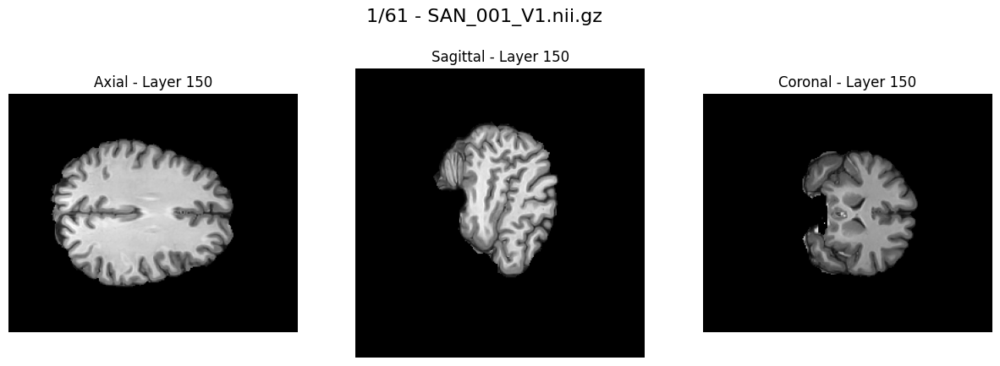

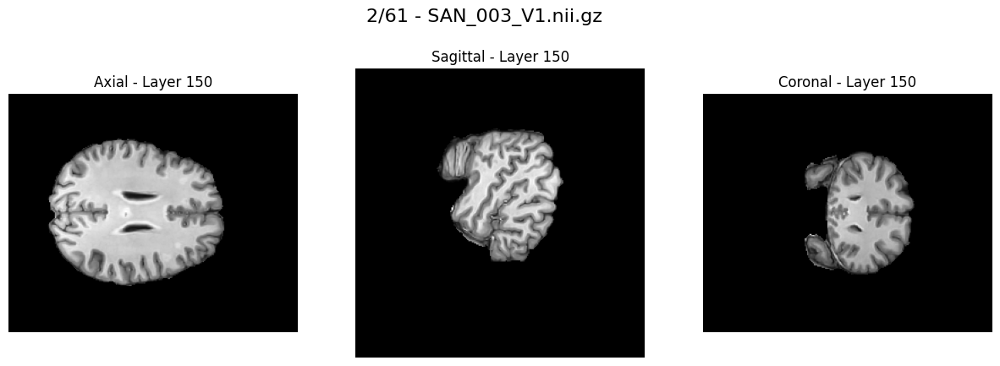

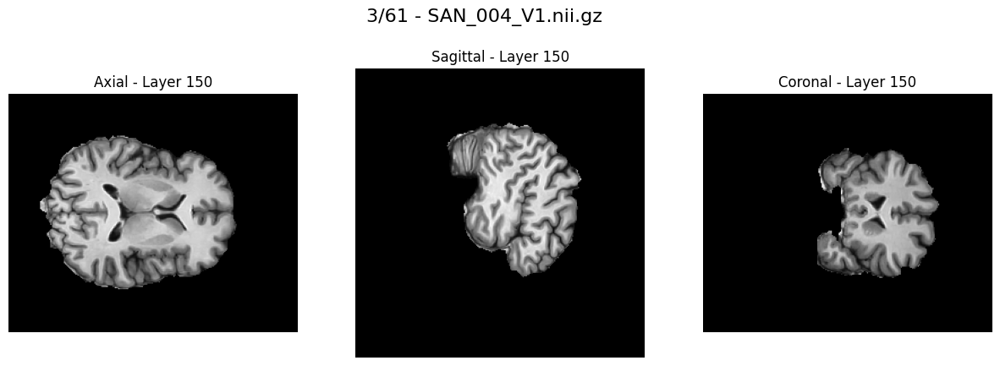

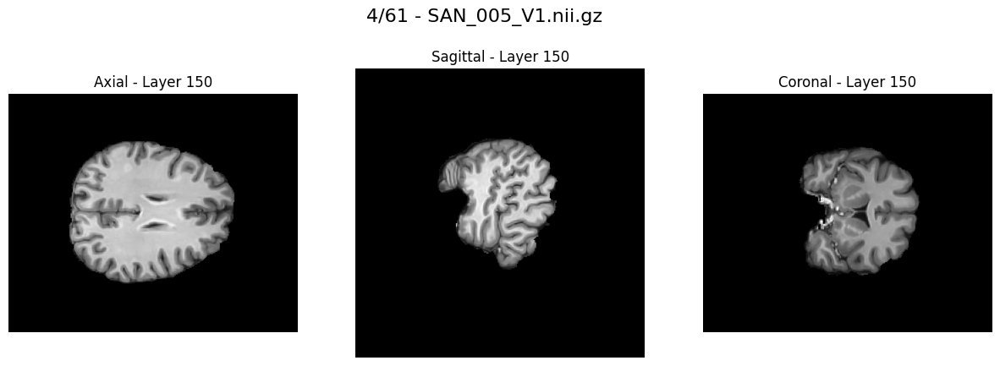

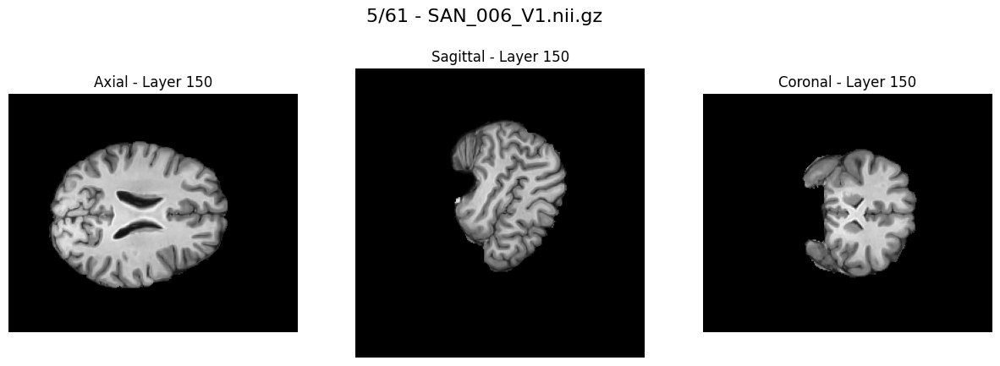

...

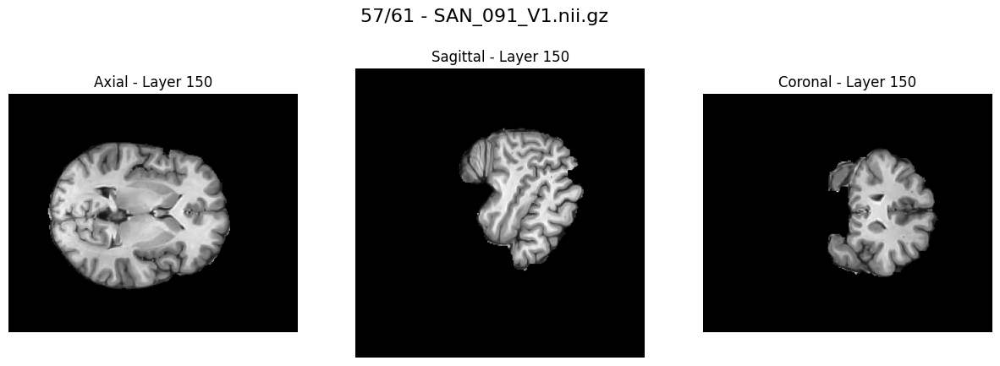

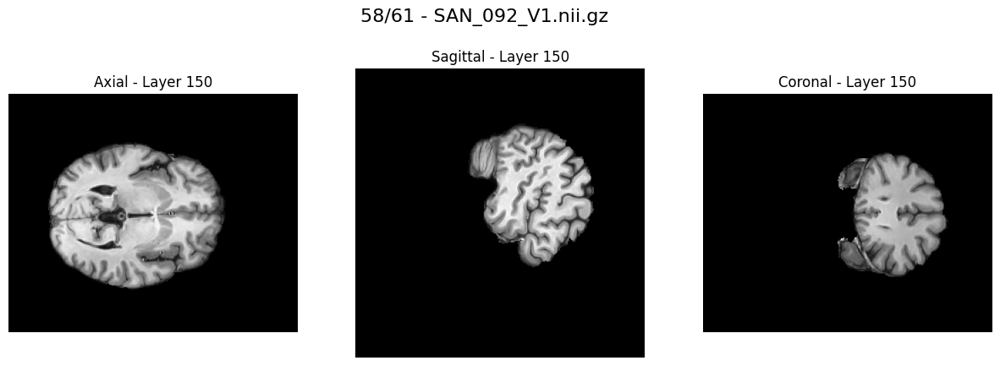

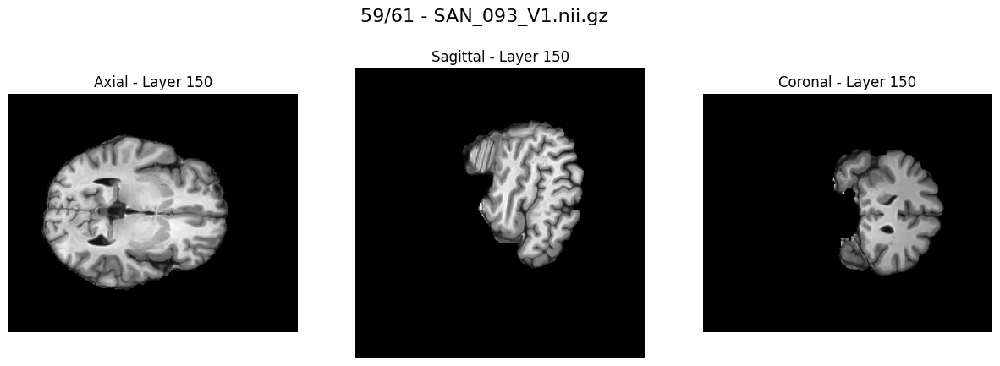

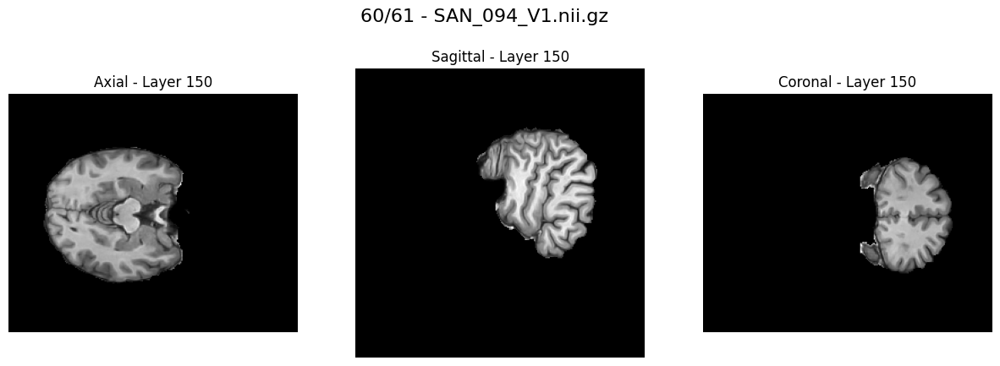

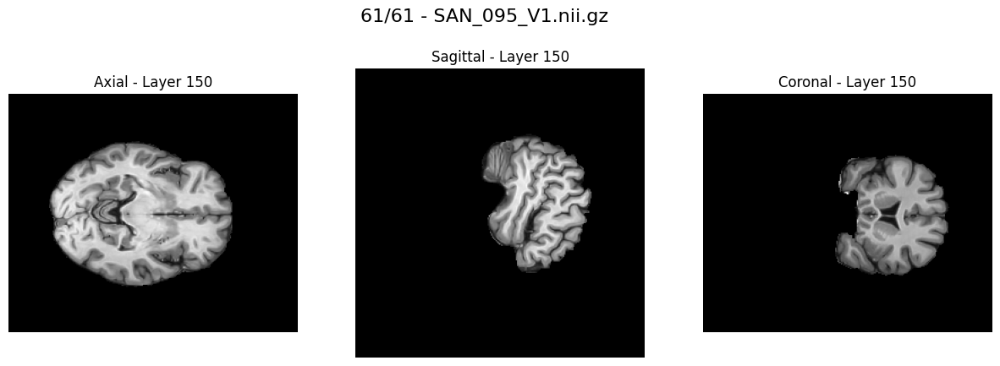

In [305]:

def show_all_images(nifti_folder, slice_index):
    """
    Loads and displays the three slices (axial, sagittal, and coronal) of all NIfTI images in a folder.
    
    :param nifti_folder: Path to the folder containing NIfTI images.
    :param slice_index: Index of the slice you want to visualize.
    """
    nifti_files = [f for f in os.listdir(nifti_folder) if f.endswith('.nii') or f.endswith('.nii.gz')]
    print(f"Total images found: {len(nifti_files)}")
    
    for i, file in enumerate(sorted(nifti_files), start=1):
        nifti_path = os.path.join(nifti_folder, file)
        img = nib.load(nifti_path)
        data = img.get_fdata()
        
        fig, axs = plt.subplots(1, 3, figsize=(15, 5))
        fig.suptitle(f"{i}/{len(nifti_files)} - {file}", fontsize=16)
        
        # Axial
        axs[0].imshow(data[:, :, slice_index], cmap="gray")
        axs[0].set_title(f"Axial - Layer {slice_index}")
        axs[0].axis("off")
        
        # Sagittal
        axs[1].imshow(data[slice_index, :, :], cmap="gray")
        axs[1].set_title(f"Sagittal - Layer {slice_index}")
        axs[1].axis("off")
        
        # Coronal
        axs[2].imshow(data[:, slice_index, :], cmap="gray")
        axs[2].set_title(f"Coronal - Layer {slice_index}")
        axs[2].axis("off")
        
        plt.show()

# Example usage
nifti_folder = '/home/jp/NeuroImagen/Biomarcadores/BIomarcadores-T1-Procesados' 
slice_index = 150  # Change this value to the index of the slice you want to visualize
show_all_images(nifti_folder, slice_index)
